In [76]:
import pandas as pd
%matplotlib inline
import matplotlib.pyplot as plt
import re
from cycler import cycler
import os

%matplotlib inline

pd.set_option('display.max_rows', 1000)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)

pd.set_option('display.max_colwidth', -1)

In [2]:
plt.rcdefaults()
plt.rcParams.update({
    'pdf.fonttype': 42,
    'ps.fonttype': 42,
    'font.family' : 'sans-serif',
    'font.sans-serif' : 'verdana',
    'font.weight' : 'medium',
    'axes.titleweight' : 'heavy',
    
    'axes.titlesize' : 'large',
    
    "figure.facecolor": "#FFFFFF",
    "axes.facecolor": "#FFFFFF",
    "axes.grid" : True,
    "axes.grid.axis" : "y",
    "grid.color"    : "#41c1f4",
    "grid.linewidth": 1,
    
    "axes.spines.left" : False,
    "axes.spines.right" : False,
    "axes.spines.top" : False,
    
    "ytick.major.size": 0,     
    "ytick.minor.size": 0,
    
    "xtick.direction" : "in",
    "xtick.major.size" : 5,
    "xtick.color"      : "#191919",
    "xtick.major.pad"      : 4,      # distance to major tick label in points
    "xtick.minor.pad"      : 3.9,      # distance to the minor tick label in point
    
    "axes.edgecolor"    :"#191919",
    "axes.prop_cycle" : plt.cycler('color', ['#518595', '#009CD7', '#72D1F6', '#108F85','#F13E20', '#711300']),
    "axes.axisbelow" : True,
    
    "legend.loc": 'lower right'
                                   
    })



# Read in CSV

In [3]:
Healthcare_Violations = pd.read_csv('export.csv')

In [4]:
Healthcare_Violations

,Company,Parent Company,Penalty Amount,Subtraction From Penalty,Penalty Amount Adjusted For Eliminating Multiple Counting,Penalty Year,Penalty Date,Primary Offense,Secondary Offense,Description,Level of Government,Action Type,Agency,Court,Civil/Criminal,Prosecution Agreement,Case ID,Private Litigation Case Title,Lawsuit Resolution,Facility State,City,Address,Zip,NAICS Code,NAICS Translation,HQ Country of Parent,HQ State of Parent,Ownership Structure,Major Industry of Parent,Specific Industry of Parent,Info Source,Info Source Archive URL,PACER Link,Captured Document,EPA/OSHA More Info Link,Notes
0,THE ENSIGN GROUP,Ensign Group,"$6,000",$0,"$6,000",2012,20120227,workplace safety or health violation,NaN,NaN,federal,agency action,Occupational Safety & Health Administration,NaN,civil,NaN,332428275,NaN,NaN,Colorado,LITTLETON,5822 S. LOWELL WAY,80123,623110.0,623110: Nursing Care Facilities,USA,California,publicly traded,healthcare services,skilled nursing facilities,Extracted from a download of OSHA's Inspection...,NaN,NaN,NaN,https://www.osha.gov/pls/imis/establishment.in...,NaN
1,"A & B Homecare Solutions, LLC",Encompass Health,"$13,843",$0,"$13,843",2008,20080309,wage and hour violation,Fair Labor Standards Act,NaN,federal,agency action,Labor Department Wage and Hour Division,NaN,civil,NaN,1503743,NaN,NaN,Connecticut,New Haven,NaN,06511,621610.0,621610: Home Health Care Services,USA,Alabama,publicly traded,healthcare services,healthcare services,"March 7, 2017 download of a dataset posted by ...",NaN,NaN,NaN,NaN,Date and year are the Findings End Date in the...
2,LOYOLA UNIVERSITY HEALTH SYSTEM,Trinity Health,"$5,600",$0,"$5,600",2012,20120123,workplace safety or health violation,NaN,NaN,federal,agency action,Occupational Safety & Health Administration,NaN,civil,NaN,331900357,NaN,NaN,Illinois,MAYWOOD,2160 1ST AVENUE,60153,622110.0,622110: General Medical and Surgical Hospitals,USA,Michigan,non-profit,healthcare services,hospitals,Extracted from a download of OSHA's Inspection...,NaN,NaN,NaN,https://www.osha.gov/pls/imis/establishment.in...,NaN
3,"ABTTC, Inc.",AAC Holdings,"$35,071",$0,"$35,071",2012,20120724,wage and hour violation,Fair Labor Standards Act,NaN,federal,agency action,Labor Department Wage and Hour Division,NaN,civil,NaN,1595285,NaN,NaN,California,Murrieta,NaN,92562,623220.0,623220: Residential Mental Health and Substanc...,USA,Tennessee,publicly traded,healthcare services,substance abuse services,"March 7, 2017 download of a dataset posted by ...",NaN,NaN,NaN,NaN,Date and year are the Findings End Date in the...
4,"ABTTC, Inc.",AAC Holdings,"$34,692",$0,"$34,692",2012,20120724,wage and hour violation,Fair Labor Standards Act,NaN,federal,agency action,Labor Department Wage and Hour Division,NaN,civil,NaN,1670571,NaN,NaN,California,San Diego,NaN,92102,623220.0,623220: Residential Mental Health and Substanc...,USA,Tennessee,publicly traded,healthcare services,substance abuse services,"March 7, 2017 download of a dataset posted by ...",NaN,NaN,NaN,NaN,Date and year are the Findings End Date in the...
5,"ABTTC, Inc.",AAC Holdings,"$9,448",$0,"$9,448",2012,20120724,wage and hour violation,Fair Labor Standards Act,NaN,federal,agency action,Labor Department Wage and Hour Division,NaN,civil,NaN,1663197,NaN,NaN,California,Murrieta,NaN,92562,623220.0,623220: Residential Mental Health and Substanc...,USA,Tennessee,publicly traded,healthcare services,substance abuse services,"March 7, 2017 download of a dataset posted by ...",NaN,NaN,NaN,NaN,Date and year are the Findings End Date in the...
6,Acadia Abilene LLC,Acadia Healthcare,"$9,420",$0,"$9,420",2010,20101215,wage and hour violation,Fair Labor Standards Act,NaN,federal,agency action,Labor Department Wage and Hour Division,NaN,civil,NaN,1536765,NaN,NaN,Texas,Abilene,NaN,79602,9660.0,NaN,USA,Tennessee,publicly traded,healthcare services,healthcare services,"March 7, 2017 download of a dataset posted by ...",NaN,NaN,NaN,NaN,Date and year are the Findings End Date in the...
7,"

In [5]:
Healthcare_Violations.Company = Healthcare_Violations.Company.str.lower()

In [6]:
Healthcare_Violations

,Company,Parent Company,Penalty Amount,Subtraction From Penalty,Penalty Amount Adjusted For Eliminating Multiple Counting,Penalty Year,Penalty Date,Primary Offense,Secondary Offense,Description,Level of Government,Action Type,Agency,Court,Civil/Criminal,Prosecution Agreement,Case ID,Private Litigation Case Title,Lawsuit Resolution,Facility State,City,Address,Zip,NAICS Code,NAICS Translation,HQ Country of Parent,HQ State of Parent,Ownership Structure,Major Industry of Parent,Specific Industry of Parent,Info Source,Info Source Archive URL,PACER Link,Captured Document,EPA/OSHA More Info Link,Notes
0,the ensign group,Ensign Group,"$6,000",$0,"$6,000",2012,20120227,workplace safety or health violation,NaN,NaN,federal,agency action,Occupational Safety & Health Administration,NaN,civil,NaN,332428275,NaN,NaN,Colorado,LITTLETON,5822 S. LOWELL WAY,80123,623110.0,623110: Nursing Care Facilities,USA,California,publicly traded,healthcare services,skilled nursing facilities,Extracted from a download of OSHA's Inspection...,NaN,NaN,NaN,https://www.osha.gov/pls/imis/establishment.in...,NaN
1,"a & b homecare solutions, llc",Encompass Health,"$13,843",$0,"$13,843",2008,20080309,wage and hour violation,Fair Labor Standards Act,NaN,federal,agency action,Labor Department Wage and Hour Division,NaN,civil,NaN,1503743,NaN,NaN,Connecticut,New Haven,NaN,06511,621610.0,621610: Home Health Care Services,USA,Alabama,publicly traded,healthcare services,healthcare services,"March 7, 2017 download of a dataset posted by ...",NaN,NaN,NaN,NaN,Date and year are the Findings End Date in the...
2,loyola university health system,Trinity Health,"$5,600",$0,"$5,600",2012,20120123,workplace safety or health violation,NaN,NaN,federal,agency action,Occupational Safety & Health Administration,NaN,civil,NaN,331900357,NaN,NaN,Illinois,MAYWOOD,2160 1ST AVENUE,60153,622110.0,622110: General Medical and Surgical Hospitals,USA,Michigan,non-profit,healthcare services,hospitals,Extracted from a download of OSHA's Inspection...,NaN,NaN,NaN,https://www.osha.gov/pls/imis/establishment.in...,NaN
3,"abttc, inc.",AAC Holdings,"$35,071",$0,"$35,071",2012,20120724,wage and hour violation,Fair Labor Standards Act,NaN,federal,agency action,Labor Department Wage and Hour Division,NaN,civil,NaN,1595285,NaN,NaN,California,Murrieta,NaN,92562,623220.0,623220: Residential Mental Health and Substanc...,USA,Tennessee,publicly traded,healthcare services,substance abuse services,"March 7, 2017 download of a dataset posted by ...",NaN,NaN,NaN,NaN,Date and year are the Findings End Date in the...
4,"abttc, inc.",AAC Holdings,"$34,692",$0,"$34,692",2012,20120724,wage and hour violation,Fair Labor Standards Act,NaN,federal,agency action,Labor Department Wage and Hour Division,NaN,civil,NaN,1670571,NaN,NaN,California,San Diego,NaN,92102,623220.0,623220: Residential Mental Health and Substanc...,USA,Tennessee,publicly traded,healthcare services,substance abuse services,"March 7, 2017 download of a dataset posted by ...",NaN,NaN,NaN,NaN,Date and year are the Findings End Date in the...
5,"abttc, inc.",AAC Holdings,"$9,448",$0,"$9,448",2012,20120724,wage and hour violation,Fair Labor Standards Act,NaN,federal,agency action,Labor Department Wage and Hour Division,NaN,civil,NaN,1663197,NaN,NaN,California,Murrieta,NaN,92562,623220.0,623220: Residential Mental Health and Substanc...,USA,Tennessee,publicly traded,healthcare services,substance abuse services,"March 7, 2017 download of a dataset posted by ...",NaN,NaN,NaN,NaN,Date and year are the Findings End Date in the...
6,acadia abilene llc,Acadia Healthcare,"$9,420",$0,"$9,420",2010,20101215,wage and hour violation,Fair Labor Standards Act,NaN,federal,agency action,Labor Department Wage and Hour Division,NaN,civil,NaN,1536765,NaN,NaN,Texas,Abilene,NaN,79602,9660.0,NaN,USA,Tennessee,publicly traded,healthcare services,healthcare services,"March 7, 2017 download of a dataset posted by ...",NaN,NaN,NaN,NaN,Date and year are the Findings End Date in the...
7,"

In [7]:
Healthcare_Violations['Parent Company'] = Healthcare_Violations['Parent Company'].str.lower()

In [8]:
Healthcare_Violations

,Company,Parent Company,Penalty Amount,Subtraction From Penalty,Penalty Amount Adjusted For Eliminating Multiple Counting,Penalty Year,Penalty Date,Primary Offense,Secondary Offense,Description,Level of Government,Action Type,Agency,Court,Civil/Criminal,Prosecution Agreement,Case ID,Private Litigation Case Title,Lawsuit Resolution,Facility State,City,Address,Zip,NAICS Code,NAICS Translation,HQ Country of Parent,HQ State of Parent,Ownership Structure,Major Industry of Parent,Specific Industry of Parent,Info Source,Info Source Archive URL,PACER Link,Captured Document,EPA/OSHA More Info Link,Notes
0,the ensign group,ensign group,"$6,000",$0,"$6,000",2012,20120227,workplace safety or health violation,NaN,NaN,federal,agency action,Occupational Safety & Health Administration,NaN,civil,NaN,332428275,NaN,NaN,Colorado,LITTLETON,5822 S. LOWELL WAY,80123,623110.0,623110: Nursing Care Facilities,USA,California,publicly traded,healthcare services,skilled nursing facilities,Extracted from a download of OSHA's Inspection...,NaN,NaN,NaN,https://www.osha.gov/pls/imis/establishment.in...,NaN
1,"a & b homecare solutions, llc",encompass health,"$13,843",$0,"$13,843",2008,20080309,wage and hour violation,Fair Labor Standards Act,NaN,federal,agency action,Labor Department Wage and Hour Division,NaN,civil,NaN,1503743,NaN,NaN,Connecticut,New Haven,NaN,06511,621610.0,621610: Home Health Care Services,USA,Alabama,publicly traded,healthcare services,healthcare services,"March 7, 2017 download of a dataset posted by ...",NaN,NaN,NaN,NaN,Date and year are the Findings End Date in the...
2,loyola university health system,trinity health,"$5,600",$0,"$5,600",2012,20120123,workplace safety or health violation,NaN,NaN,federal,agency action,Occupational Safety & Health Administration,NaN,civil,NaN,331900357,NaN,NaN,Illinois,MAYWOOD,2160 1ST AVENUE,60153,622110.0,622110: General Medical and Surgical Hospitals,USA,Michigan,non-profit,healthcare services,hospitals,Extracted from a download of OSHA's Inspection...,NaN,NaN,NaN,https://www.osha.gov/pls/imis/establishment.in...,NaN
3,"abttc, inc.",aac holdings,"$35,071",$0,"$35,071",2012,20120724,wage and hour violation,Fair Labor Standards Act,NaN,federal,agency action,Labor Department Wage and Hour Division,NaN,civil,NaN,1595285,NaN,NaN,California,Murrieta,NaN,92562,623220.0,623220: Residential Mental Health and Substanc...,USA,Tennessee,publicly traded,healthcare services,substance abuse services,"March 7, 2017 download of a dataset posted by ...",NaN,NaN,NaN,NaN,Date and year are the Findings End Date in the...
4,"abttc, inc.",aac holdings,"$34,692",$0,"$34,692",2012,20120724,wage and hour violation,Fair Labor Standards Act,NaN,federal,agency action,Labor Department Wage and Hour Division,NaN,civil,NaN,1670571,NaN,NaN,California,San Diego,NaN,92102,623220.0,623220: Residential Mental Health and Substanc...,USA,Tennessee,publicly traded,healthcare services,substance abuse services,"March 7, 2017 download of a dataset posted by ...",NaN,NaN,NaN,NaN,Date and year are the Findings End Date in the...
5,"abttc, inc.",aac holdings,"$9,448",$0,"$9,448",2012,20120724,wage and hour violation,Fair Labor Standards Act,NaN,federal,agency action,Labor Department Wage and Hour Division,NaN,civil,NaN,1663197,NaN,NaN,California,Murrieta,NaN,92562,623220.0,623220: Residential Mental Health and Substanc...,USA,Tennessee,publicly traded,healthcare services,substance abuse services,"March 7, 2017 download of a dataset posted by ...",NaN,NaN,NaN,NaN,Date and year are the Findings End Date in the...
6,acadia abilene llc,acadia healthcare,"$9,420",$0,"$9,420",2010,20101215,wage and hour violation,Fair Labor Standards Act,NaN,federal,agency action,Labor Department Wage and Hour Division,NaN,civil,NaN,1536765,NaN,NaN,Texas,Abilene,NaN,79602,9660.0,NaN,USA,Tennessee,publicly traded,healthcare services,healthcare services,"March 7, 2017 download of a dataset posted by ...",NaN,NaN,NaN,NaN,Date and year are the Findings End Date in the...
7,"

In [9]:
Healthcare_Violations.dtypes

Company                                                       object
Parent Company                                                object
Penalty Amount                                                object
Subtraction From Penalty                                      object
Penalty Amount Adjusted For Eliminating Multiple Counting     object
Penalty Year                                                   int64
Penalty Date                                                   int64
Primary Offense                                               object
Secondary Offense                                             object
Description                                                   object
Level of Government                                           object
Action Type                                                   object
Agency                                                        object
Court                                                         object
Civil/Criminal                    

In [10]:
Healthcare_Violations['Penalty Amount'] = Healthcare_Violations['Penalty Amount'].str.extract(r'\$(\d.*)')

In [11]:
Healthcare_Violations['Subtraction From Penalty'] = Healthcare_Violations['Subtraction From Penalty'].str.extract(r'\$(\d.*)')

In [12]:
Healthcare_Violations['Penalty Amount Adjusted For Eliminating Multiple Counting'] = Healthcare_Violations['Penalty Amount Adjusted For Eliminating Multiple Counting'].str.extract(r'\$(\d.*)')

In [13]:
Healthcare_Violations['Penalty Date'] = pd.to_datetime(Healthcare_Violations['Penalty Date'] , format= "%Y%m%d")


In [14]:
Healthcare_Violations['Penalty Year'] = Healthcare_Violations['Penalty Year'].astype(int)

In [15]:
Healthcare_Violations['Penalty Year'].value_counts()

2015    133
2016    108
2017     97
2013     82
2012     75
2010     73
2014     69
2011     60
2006     52
2009     44
2005     43
2004     42
2008     39
2007     36
2003     32
2002     27
2001     24
2000     18
2018     10
Name: Penalty Year, dtype: int64

In [16]:
Healthcare_Violations['Penalty_Year_Date_Time'] = pd.to_datetime(Healthcare_Violations['Penalty Year'] , format= "%Y")


In [17]:
Healthcare_Violations.dtypes

Company                                                              object
Parent Company                                                       object
Penalty Amount                                                       object
Subtraction From Penalty                                             object
Penalty Amount Adjusted For Eliminating Multiple Counting            object
Penalty Year                                                          int64
Penalty Date                                                 datetime64[ns]
Primary Offense                                                      object
Secondary Offense                                                    object
Description                                                          object
Level of Government                                                  object
Action Type                                                          object
Agency                                                               object
Court       

In [18]:
Healthcare_Violations

,Company,Parent Company,Penalty Amount,Subtraction From Penalty,Penalty Amount Adjusted For Eliminating Multiple Counting,Penalty Year,Penalty Date,Primary Offense,Secondary Offense,Description,Level of Government,Action Type,Agency,Court,Civil/Criminal,Prosecution Agreement,Case ID,Private Litigation Case Title,Lawsuit Resolution,Facility State,City,Address,Zip,NAICS Code,NAICS Translation,HQ Country of Parent,HQ State of Parent,Ownership Structure,Major Industry of Parent,Specific Industry of Parent,Info Source,Info Source Archive URL,PACER Link,Captured Document,EPA/OSHA More Info Link,Notes,Penalty_Year_Date_Time
0,the ensign group,ensign group,"6,000",0,"6,000",2012,2012-02-27,workplace safety or health violation,NaN,NaN,federal,agency action,Occupational Safety & Health Administration,NaN,civil,NaN,332428275,NaN,NaN,Colorado,LITTLETON,5822 S. LOWELL WAY,80123,623110.0,623110: Nursing Care Facilities,USA,California,publicly traded,healthcare services,skilled nursing facilities,Extracted from a download of OSHA's Inspection...,NaN,NaN,NaN,https://www.osha.gov/pls/imis/establishment.in...,NaN,2012-01-01
1,"a & b homecare solutions, llc",encompass health,"13,843",0,"13,843",2008,2008-03-09,wage and hour violation,Fair Labor Standards Act,NaN,federal,agency action,Labor Department Wage and Hour Division,NaN,civil,NaN,1503743,NaN,NaN,Connecticut,New Haven,NaN,06511,621610.0,621610: Home Health Care Services,USA,Alabama,publicly traded,healthcare services,healthcare services,"March 7, 2017 download of a dataset posted by ...",NaN,NaN,NaN,NaN,Date and year are the Findings End Date in the...,2008-01-01
2,loyola university health system,trinity health,"5,600",0,"5,600",2012,2012-01-23,workplace safety or health violation,NaN,NaN,federal,agency action,Occupational Safety & Health Administration,NaN,civil,NaN,331900357,NaN,NaN,Illinois,MAYWOOD,2160 1ST AVENUE,60153,622110.0,622110: General Medical and Surgical Hospitals,USA,Michigan,non-profit,healthcare services,hospitals,Extracted from a download of OSHA's Inspection...,NaN,NaN,NaN,https://www.osha.gov/pls/imis/establishment.in...,NaN,2012-01-01
3,"abttc, inc.",aac holdings,"35,071",0,"35,071",2012,2012-07-24,wage and hour violation,Fair Labor Standards Act,NaN,federal,agency action,Labor Department Wage and Hour Division,NaN,civil,NaN,1595285,NaN,NaN,California,Murrieta,NaN,92562,623220.0,623220: Residential Mental Health and Substanc...,USA,Tennessee,publicly traded,healthcare services,substance abuse services,"March 7, 2017 download of a dataset posted by ...",NaN,NaN,NaN,NaN,Date and year are the Findings End Date in the...,2012-01-01
4,"abttc, inc.",aac holdings,"34,692",0,"34,692",2012,2012-07-24,wage and hour violation,Fair Labor Standards Act,NaN,federal,agency action,Labor Department Wage and Hour Division,NaN,civil,NaN,1670571,NaN,NaN,California,San Diego,NaN,92102,623220.0,623220: Residential Mental Health and Substanc...,USA,Tennessee,publicly traded,healthcare services,substance abuse services,"March 7, 2017 download of a dataset posted by ...",NaN,NaN,NaN,NaN,Date and year are the Findings End Date in the...,2012-01-01
5,"abttc, inc.",aac holdings,"9,448",0,"9,448",2012,2012-07-24,wage and hour violation,Fair Labor Standards Act,NaN,federal,agency action,Labor Department Wage and Hour Division,NaN,civil,NaN,1663197,NaN,NaN,California,Murrieta,NaN,92562,623220.0,623220: Residential Mental Health and Substanc...,USA,Tennessee,publicly traded,healthcare services,substance abuse services,"March 7, 2017 download of a dataset posted by ...",NaN,NaN,NaN,NaN,Date and year are the Findings End Date in the...,2012-01-01
6,acadia abilene llc,acadia healthcare,"9,420",0,"9,420",2010,2010-12-15,wage and hour violation,Fair Labor Standards Act,NaN,federal,agency action,Labor Department Wage and Hour Division,NaN,civil,NaN,1536765,NaN,NaN,Texas,Abilene,NaN,79602,9660.0,NaN,USA,Tennessee,publicly traded,healthcare services,healthcare services,"March 7, 2017 download of a dataset po

In [19]:
Healthcare_Violations['Penalty Amount'] = Healthcare_Violations['Penalty Amount'].str.replace("," , "")

In [20]:
Healthcare_Violations['Penalty Amount'] = Healthcare_Violations['Penalty Amount'].astype(int)

In [21]:
Healthcare_Violations['Subtraction From Penalty'] = Healthcare_Violations['Subtraction From Penalty'].str.replace("," , "")

In [22]:
Healthcare_Violations['Penalty Amount Adjusted For Eliminating Multiple Counting'] = Healthcare_Violations['Penalty Amount Adjusted For Eliminating Multiple Counting'].str.replace("," , "") 

In [23]:
Healthcare_Violations['Penalty Amount Adjusted For Eliminating Multiple Counting']

Healthcare_Violations['Penalty Amount Adjusted For Eliminating Multiple Counting'] = Healthcare_Violations['Penalty Amount Adjusted For Eliminating Multiple Counting'].astype(int)

In [24]:
Healthcare_Violations['Subtraction From Penalty'] = Healthcare_Violations['Subtraction From Penalty'].str.replace("," , "")


Healthcare_Violations['Subtraction From Penalty'] = Healthcare_Violations['Subtraction From Penalty'].astype(int)

In [25]:
Healthcare_Violations.dtypes

Company                                                              object
Parent Company                                                       object
Penalty Amount                                                        int64
Subtraction From Penalty                                              int64
Penalty Amount Adjusted For Eliminating Multiple Counting             int64
Penalty Year                                                          int64
Penalty Date                                                 datetime64[ns]
Primary Offense                                                      object
Secondary Offense                                                    object
Description                                                          object
Level of Government                                                  object
Action Type                                                          object
Agency                                                               object
Court       

In [26]:
Violations_Years = Healthcare_Violations['Penalty_Year_Date_Time'].value_counts().reset_index()

Violations_Years = Violations_Years.drop(Violations_Years.index[[18]])


In [125]:
Violations_Years.dtypes

Year          datetime64[ns]
Violations    int64         
dtype: object

In [27]:
Healthcare_Violations.to_csv('Healthcare_Violations.csv' , index=False)

In [28]:
Violations_Years.rename(columns={'index' : 'Year' , 'Penalty_Year_Date_Time' : 'Violations'} , inplace=True)

# 1) Let's See How Healthcare Violations Change By Year

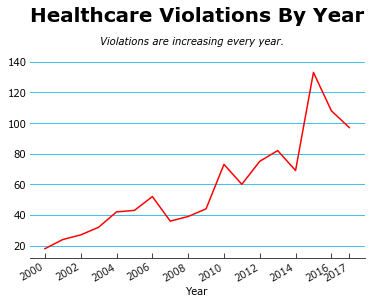

In [121]:
ax = Violations_Years.plot(x='Year' , y='Violations' , color='red')

ax.legend_.remove()


ax.set_xticks(['2000-01-01' , '2002-01-01'  , '2004-01-01'  , '2006-01-01'  , '2008-01-01'  , '2010-01-01' , '2012-01-01' , '2014-01-01' , '2016-01-01', '2017-01-01'])

ax.set_yticks([20 , 40 , 60 , 80 , 100 , 120 , 140])

ax.grid(b=None, which='major', axis='x')

ax.set_title("Healthcare Violations By Year", pad=40, fontsize=20)
plt.gcf().text(0.5, 0.94, "Violations are increasing every year.", ha='center', fontsize=10, fontstyle='italic')


plt.show()

# 2) Let's see what most of these violations were for

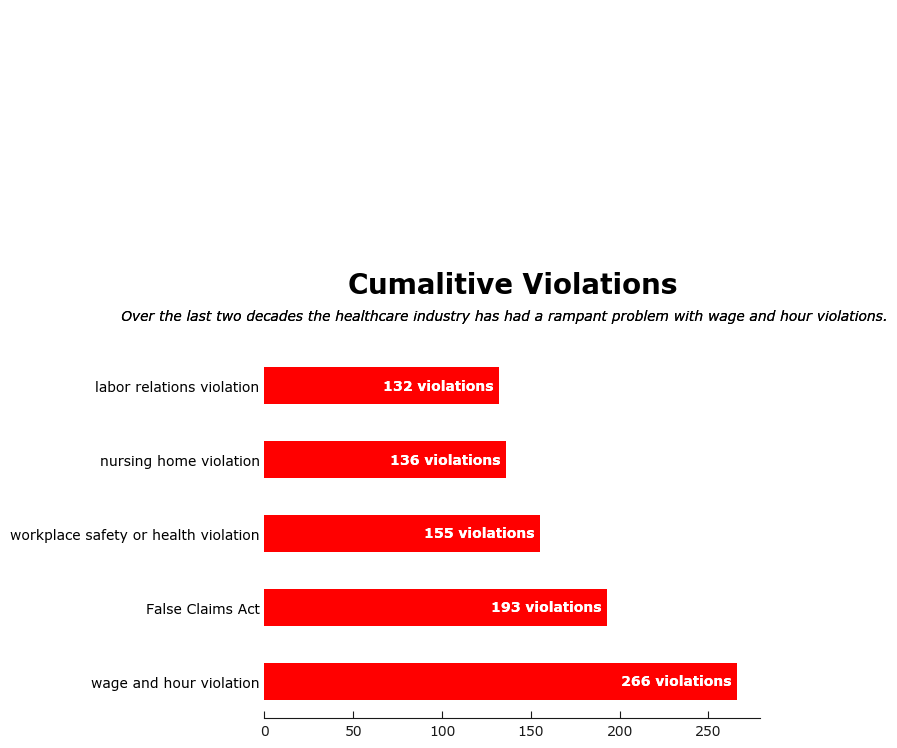

In [44]:
ax = Healthcare_Violations['Primary Offense'].value_counts().head(5).plot(kind='barh' , color='red')

ax.grid()

ax.set_title("Cumalitive Violations", pad=40, fontsize=20)
plt.gcf().text(0.5, 0.94, "Over the last two decades the healthcare industry has had a rampant problem with wage and hour violations.", ha='center', fontsize=10, fontstyle='italic')


for i, bar in enumerate(ax.patches):
    # print(i)
    value = str(int(round(bar.get_width()))) + " violations"
    x_pos = bar.get_width() - 3
    y_pos = i
    # ax.text(x_pos, y_pos, value, verticalalignment='center')
    ax.text(x_pos, y_pos, value, va='center', ha='right', color='white', fontweight='bold')

plt.show()


# 3) Let's see what these violations looked like in 2016

In [31]:
Violations_2016 = Healthcare_Violations[Healthcare_Violations['Penalty Year'] == 2016]

In [32]:
Healthcare_Violations['Penalty Year'].value_counts()

2015    133
2016    108
2017     97
2013     82
2012     75
2010     73
2014     69
2011     60
2006     52
2009     44
2005     43
2004     42
2008     39
2007     36
2003     32
2002     27
2001     24
2000     18
2018     10
Name: Penalty Year, dtype: int64

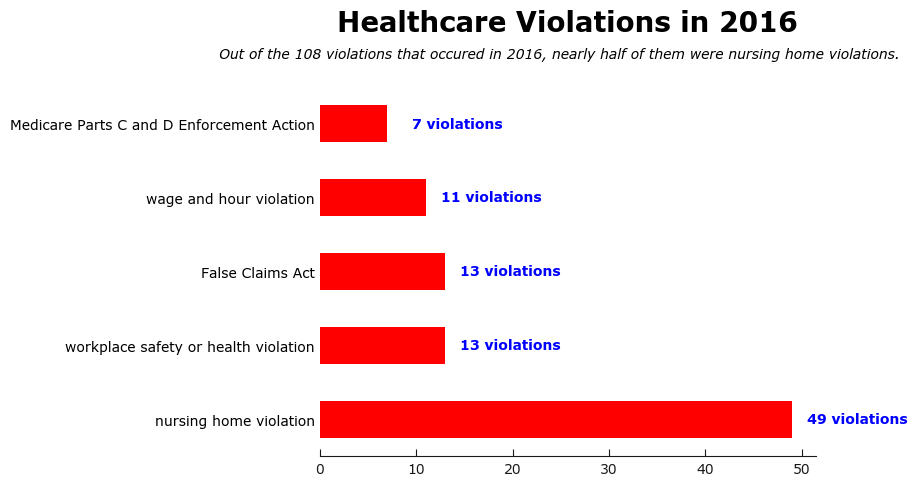

In [45]:
ax = Violations_2016['Primary Offense'].value_counts().head(5).plot(kind='barh' , color='red')


ax.grid()

ax.set_title("Healthcare Violations in 2016", pad=40, fontsize=20)
plt.gcf().text(0.5, 0.94, "Out of the 108 violations that occured in 2016, nearly half of them were nursing home violations.", ha='center', fontsize=10, fontstyle='italic')


for i, bar in enumerate(ax.patches):
    # print(i)
    value = str(int(round(bar.get_width()))) + " violations"
    x_pos = bar.get_width() + 12
    y_pos = i
    # ax.text(x_pos, y_pos, value, verticalalignment='center')
    ax.text(x_pos, y_pos, value, va='center', ha='right', color='blue', fontweight='bold')

plt.show()

# 4 ) What about in 2017

In [34]:
Violations_2017 = Healthcare_Violations[Healthcare_Violations['Penalty Year'] == 2017]

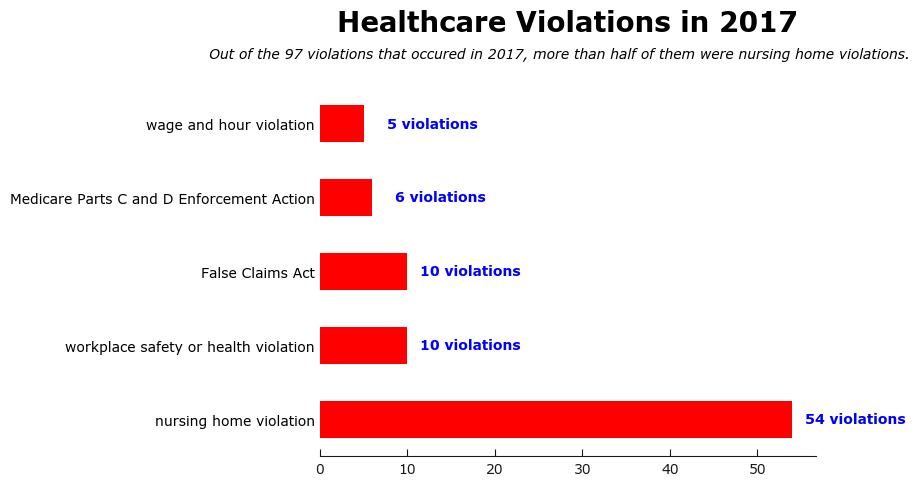

In [46]:
ax = Violations_2017['Primary Offense'].value_counts().head(5).plot(kind='barh' , color='red')


ax.grid()

ax.set_title("Healthcare Violations in 2017", pad=40, fontsize=20)
plt.gcf().text(0.5, 0.94, "Out of the 97 violations that occured in 2017, more than half of them were nursing home violations.", ha='center', fontsize=10, fontstyle='italic')


for i, bar in enumerate(ax.patches):
    # print(i)
    value = str(int(round(bar.get_width()))) + " violations"
    x_pos = bar.get_width() + 13
    y_pos = i
    # ax.text(x_pos, y_pos, value, verticalalignment='center')
    ax.text(x_pos, y_pos, value, va='center', ha='right', color='blue', fontweight='bold')

plt.show()

# 5) Let's see who the big violators were in 2017 and 2016

In [36]:
Violations_2017['Parent Company'].value_counts().mean().round()

3.0

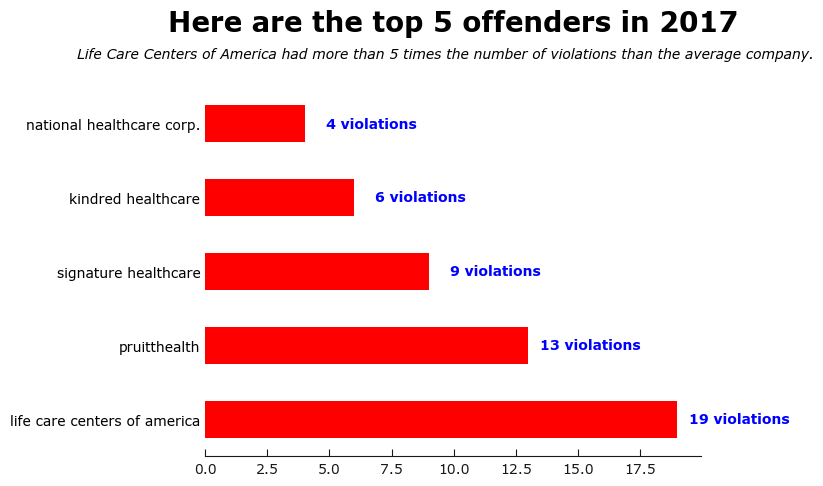

In [47]:
ax = Violations_2017['Parent Company'].value_counts().head(5).plot(kind='barh' , color='red')


ax.grid()

ax.set_title("Here are the top 5 offenders in 2017", pad=40, fontsize=20)
plt.gcf().text(0.5, 0.94, "Life Care Centers of America had more than 5 times the number of violations than the average company.", ha='center', fontsize=10, fontstyle='italic')


for i, bar in enumerate(ax.patches):
    # print(i)
    value = str(int(round(bar.get_width()))) + " violations"
    x_pos = bar.get_width() + 4.5
    y_pos = i
    # ax.text(x_pos, y_pos, value, verticalalignment='center')
    ax.text(x_pos, y_pos, value, va='center', ha='right', color='blue', fontweight='bold')

plt.show()


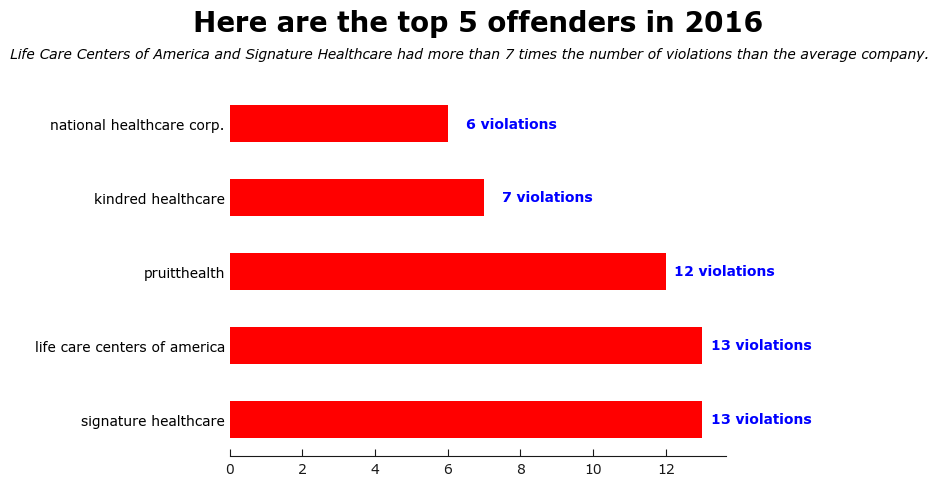

In [54]:
ax = Violations_2016['Parent Company'].value_counts().head(5).plot(kind='barh' , color='red')


ax.grid()

ax.set_title("Here are the top 5 offenders in 2016", pad=40, fontsize=20)
plt.gcf().text(0.5, 0.94, "Life Care Centers of America and Signature Healthcare had more than 7 times the number of violations than the average company.", ha='center', fontsize=10, fontstyle='italic')


for i, bar in enumerate(ax.patches):
    # print(i)
    value = str(int(round(bar.get_width()))) + " violations"
    x_pos = bar.get_width() + 3
    y_pos = i
    # ax.text(x_pos, y_pos, value, verticalalignment='center')
    ax.text(x_pos, y_pos, value, va='center', ha='right', color='blue', fontweight='bold')

plt.show()


In [40]:
Healthcare_Violations.to_csv('Healthcare_Violations_Cleaned.csv' , index=False)

In [56]:
Violations_2016['Parent Company'].value_counts().mean().round()

2.0

# 6) It seems like Life Care Centers of America and Signature Healthcare are both worth looking into as they have unusually high number of violations

<sub> Let's make a dataframe for both these companies in 2016 and 2017

In [65]:
Signature_Healthcare_2016 = Violations_2016[Violations_2016['Parent Company'] == 'signature healthcare']

In [64]:
Signature_Healthcare_2017 = Violations_2017[Violations_2017['Parent Company'] == 'signature healthcare']

In [60]:
Lifecare_America_2016 = Violations_2016[Violations_2016['Parent Company'] == 'life care centers of america']

In [61]:
Lifecare_America_2017 = Violations_2017[Violations_2017['Parent Company'] == 'life care centers of america']

## What were these companies in violation of?

In [68]:
Signature_Healthcare_2016['Primary Offense'].value_counts()

nursing home violation    13
Name: Primary Offense, dtype: int64

In [69]:
Signature_Healthcare_2017['Primary Offense'].value_counts()

nursing home violation    9
Name: Primary Offense, dtype: int64

In [70]:
Lifecare_America_2016['Primary Offense'].value_counts()

nursing home violation    12
False Claims Act           1
Name: Primary Offense, dtype: int64

In [71]:
Lifecare_America_2017['Primary Offense'].value_counts()

nursing home violation    19
Name: Primary Offense, dtype: int64

In [82]:
Violations_2016['Primary Offense'].value_counts().sum()

108

In [86]:
Signature_Healthcare_2016

,Company,Parent Company,Penalty Amount,Subtraction From Penalty,Penalty Amount Adjusted For Eliminating Multiple Counting,Penalty Year,Penalty Date,Primary Offense,Secondary Offense,Description,Level of Government,Action Type,Agency,Court,Civil/Criminal,Prosecution Agreement,Case ID,Private Litigation Case Title,Lawsuit Resolution,Facility State,City,Address,Zip,NAICS Code,NAICS Translation,HQ Country of Parent,HQ State of Parent,Ownership Structure,Major Industry of Parent,Specific Industry of Parent,Info Source,Info Source Archive URL,PACER Link,Captured Document,EPA/OSHA More Info Link,Notes,Penalty_Year_Date_Time
876,signature healthcare of south pittsburg rehab & we,signature healthcare,7800,0,7800,2016,2016-04-27,nursing home violation,NaN,NaN,federal,agency action,Centers for Medicare & Medicaid Services,NaN,civil,NaN,NaN,NaN,NaN,Tennessee,SOUTH PITTSBURG,201 EAST 10TH STREET,37380,NaN,NaN,USA,Kentucky,privately held,healthcare services,rehabilitation and skilled nursing facilities,https://data.medicare.gov/Nursing-Home-Compare/Penalties/g6vv-u9sr/data,NaN,NaN,NaN,NaN,NaN,2016-01-01
885,signature healthcare at jackson manor rehab & well,signature healthcare,8458,0,8458,2016,2016-11-16,nursing home violation,NaN,NaN,federal,agency action,Centers for Medicare & Medicaid Services,NaN,civil,NaN,NaN,NaN,NaN,Kentucky,ANNVILLE,96 HIGHWAY 3444,40402,NaN,NaN,USA,Kentucky,privately held,healthcare services,rehabilitation and skilled nursing facilities,https://data.medicare.gov/Nursing-Home-Compare/Penalties/g6vv-u9sr/data,NaN,NaN,NaN,NaN,NaN,2016-01-01
895,signature healthcare of fort wayne,signature healthcare,10431,0,10431,2016,2016-11-21,nursing home violation,NaN,NaN,federal,agency action,Centers for Medicare & Medicaid Services,NaN,civil,NaN,NaN,NaN,NaN,Indiana,FORT WAYNE,6006 BRANDY CHASE COVE,46815,NaN,NaN,USA,Kentucky,privately held,healthcare services,rehabilitation and skilled nursing facilities,https://data.medicare.gov/Nursing-Home-Compare/Penalties/g6vv-u9sr/data,NaN,NaN,NaN,NaN,NaN,2016-01-01
932,signature healthcare of warren,signature healthcare,25545,0,25545,2016,2016-02-29,nursing home violation,NaN,NaN,federal,agency action,Centers for Medicare & Medicaid Services,NaN,civil,NaN,NaN,NaN,NaN,Ohio,WARREN,2473 NORTH RD NE,44483,NaN,NaN,USA,Kentucky,privately held,healthcare services,rehabilitation and skilled nursing facilities,https://data.medicare.gov/Nursing-Home-Compare/Penalties/g6vv-u9sr/data,NaN,NaN,NaN,NaN,NaN,2016-01-01
938,signature healthcare of trimble county,signature healthcare,28795,0,28795,2016,2016-08-18,nursing home violation,NaN,NaN,federal,agency action,Centers for Medicare & Medicaid Services,NaN,civil,NaN,NaN,NaN,NaN,Kentucky,BEDFORD,50 SHEPHERD LANE,40006,NaN,NaN,USA,Kentucky,privately held,healthcare services,rehabilitation and skilled nursing facilities,https://data.medicare.gov/Nursing-Home-Compare/Penalties/g6vv-u9sr/data,NaN,NaN,NaN,NaN,NaN,2016-01-01
942,signature healthcare at st peter villa,signature healthcare,32869,0,32869,2016,2016-10-13,nursing home violation,NaN,NaN,federal,agency action,Centers for Medicare & Medicaid Services,NaN,civil,NaN,NaN,NaN,NaN,Tennessee,MEMPHIS,141 N MCLEAN,38104,NaN,NaN,USA,Kentucky,privately held,healthcare services,rehabilitation and skilled nursing facilities,https://data.medicare.gov/Nursing-Home-Compare/Penalties/g6vv-u9sr/data,NaN,NaN,NaN,NaN,NaN,2016-01-01
951,signature healthcare of georgetown,signature healthcare,47938,0,47938,2016,2016-06-02,nursing home violation,NaN,NaN,federal,agency action,Centers for Medicare & Medicaid Services,NaN,civil,NaN,NaN,NaN,NaN,Kentucky,GEORGETOWN,102 POCAHONTAS TRAIL,40324,NaN,NaN,USA,Kentucky,privately held,healthcare services,rehabilitation and skilled nursing facilities,https://data.medicare.gov/Nursing-Home-Compare/Penalties/g6vv-u9sr/data,NaN,NaN,NaN,NaN,NaN,2016-01-01
954,signature healthcare of mccreary county rehab & we,signature healthcare,52333,0,52333,2016,2016-04-12,nursing home violation,NaN,NaN,f

In [94]:
Signature_Healthcare_2016['Penalty Amount'].sum()

1071967

In [107]:
Lifecare_America_2016['Penalty Amount'].sum()

145801575

## Singature Healthcare paid out 1,071,967 USD for Nursing Care violations in 2016. Let's see how it compares to other companies violations that year.

In [101]:
Violations_2016.groupby('Parent Company')['Penalty Amount'].sum().sort_values(ascending=False).head(20)

Parent Company
tenet healthcare                   513137969
life care centers of america       145801575
kindred healthcare                 127728484
children's hospital los angeles    27000000 
amedisys                           13443642 
dignity health                     5900000  
centene                            5298250  
advocate health care               4750000  
upmc                               2505932  
northwell health                   2500000  
unitedhealth group                 2498850  
sentara healthcare                 2106175  
adventist health system            2090000  
mount sinai medical center         1900000  
anthem                             1650000  
sutter health                      1507000  
civitas solutions                  1500000  
aurora health care                 1250000  
signature healthcare               1071967  
pruitthealth                       916537   
Name: Penalty Amount, dtype: int64

# It seems like Signature isn't even in the top ten, whereas Life Care Centers of America paid out a larger amount. I wonder why and what were these payments like last year?

In [103]:
Violations_2017.groupby('Parent Company')['Penalty Amount'].sum().sort_values(ascending=False).head(20)

Parent Company
chemed                                    75000000
davita healthcare partners                69700000
carecore national                         54000000
genesis healthcare                        53639288
mercy (sisters of mercy health system)    34000000
envision healthcare holdings              29600000
christus health                           12247080
hca holdings                              8608247 
quest diagnostics                         8350000 
kaiser permanente                         7150900 
carolinas healthcare system               6500000 
hartford healthcare                       2906122 
charles river laboratories                1800000 
wellcare health plans                     1174300 
life care centers of america              558888  
air methods corp.                         400000  
ssm health                                356500  
signature healthcare                      356278  
pruitthealth                              284166  
memorial hermann

In [106]:
Healthcare_Violations.groupby('Parent Company')['Penalty Amount'].median().sort_values(ascending=False).head(20)

Parent Company
millennium health                          256000000.0
scan health plan                           159988975.0
halifax health                             85000000.0 
health alliance of greater cincinnati      55300000.0 
carecore national                          54000000.0 
palmetto health                            37130541.5 
columbus regional health                   35000000.0 
lhc group                                  32523916.0 
children's hospital los angeles            27000000.0 
intermountain healthcare                   25500000.0 
kpc healthcare                             14500000.0 
archbold medical center                    13900000.0 
triwest healthcare alliance corporation    10000000.0 
quorum health                              9022554.0  
u.s. renal care                            7300000.0  
bio-rad laboratories                       7189500.0  
rwjbarnabas health                         5800000.0  
adventist health system                    5412502

In [108]:
frames = [Signature_Healthcare_2016 , Lifecare_America_2016]

In [109]:
Signature_Lifecare_2016 = pd.concat(frames)

In [111]:
Signature_Lifecare_2016.reset_index(drop=True , inplace=True)

In [113]:
Signature_Lifecare_2016['Primary Offense'].value_counts()

nursing home violation    25
False Claims Act          1 
Name: Primary Offense, dtype: int64

In [114]:
Signature_Lifecare_2016= Signature_Lifecare_2016[~Signature_Lifecare_2016['Primary Offense'].isin(['False Claims Act'])]

In [115]:
Signature_Lifecare_2016['Primary Offense'].value_counts()

nursing home violation    25
Name: Primary Offense, dtype: int64

In [116]:
Signature_Lifecare_2016.to_csv('Top_2_Nursing_Home_Violations_2016.csv' , index=False)

In [117]:
Violations_2017.to_csv('Violations_2017.csv' , index=False)

In [118]:
Violations_2016.to_csv('Violations_2016.csv' , index=False)

In [119]:
frames = [Signature_Healthcare_2017 , Lifecare_America_2017]

Signature_Lifecare_2017 = pd.concat(frames)

Signature_Lifecare_2017.reset_index(drop=True , inplace=True)

In [120]:
Signature_Lifecare_2017.to_csv('Top_2_Nursing_Home_Violations_2017.csv' , index=False)